

```
# E`sto tiene formato de código`
```

**ESCUELA DE INGENIERÍA MECATRÓNICA**

## `PROCESAMIENTO DIGITAL DE SEÑALES E IMÁGENES`

### `Docente: Ms. Ing. Emerson Maximo Asto Rodriguez`
### `Integrantes:`
####`Álvarez Sanchez Arturo Estéfano`
####`Muñoz Vega Luis Enrique`
####`Querevalú Vasquez Carlos Marcelito`
```
Práctica 7A: Filtrado en el espacio
```

### 1. Implemente un algoritmo que permita realizar la correlacion 2D de una imagen de MxN con una mascara de mxn
* El algoritmo debe retornar una imagen de las mismas dimensiones que la imagen de entrada, recuerde que el "padding" usualmente se hace con ceros, no obstante se puede duplicar filas o columnas del borde, o hacerlo mediante un espejo sobre el borde.*

* El algoritmo tambien puede obtener la solución sin necesidad del "padding", agregando varias condicionales que permitan solo ponderar con los datos coincidentes.*

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
def filtro_espacial(imagen, filtro):
    M, N = imagen.shape #Obteniendo las dimensiones de la imagen
    m, n = filtro.shape #Obteniendo las dimensiones del filtro

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * filtro
            resultado[i-filas_add, j-columnas_add] = np.sum(multiplicacion)

    return resultado

1. ¿Por qué es importante el uso de técnicas de padding en la aplicación de filtros espaciales?

  El padding permite procesar píxeles en los bordes de la imagen, evitando pérdida de información y manteniendo el tamaño original de la imagen.

2. Explica qué es un kernel (o máscara) en un filtro espacial y cómo influye su tamaño en el procesamiento de imágenes.

  Un kernel es una matriz pequeña que recorre la imagen aplicando operaciones; su tamaño afecta el nivel de detalle: tamaños grandes capturan características más amplias, mientras que tamaños pequeños resaltan detalles finos.


In [ ]:
img = np.arange(100).reshape(10,10)
filtro = np.ones((5,7))

print(img)
print(filtro)

img_filtrada = filtro_espacial(img, filtro)

[[ 0  1  2  3  4  5  6  7  8  9]
 [10 11 12 13 14 15 16 17 18 19]
 [20 21 22 23 24 25 26 27 28 29]
 [30 31 32 33 34 35 36 37 38 39]
 [40 41 42 43 44 45 46 47 48 49]
 [50 51 52 53 54 55 56 57 58 59]
 [60 61 62 63 64 65 66 67 68 69]
 [70 71 72 73 74 75 76 77 78 79]
 [80 81 82 83 84 85 86 87 88 89]
 [90 91 92 93 94 95 96 97 98 99]]
[[1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]
 [1. 1. 1. 1. 1. 1. 1.]]


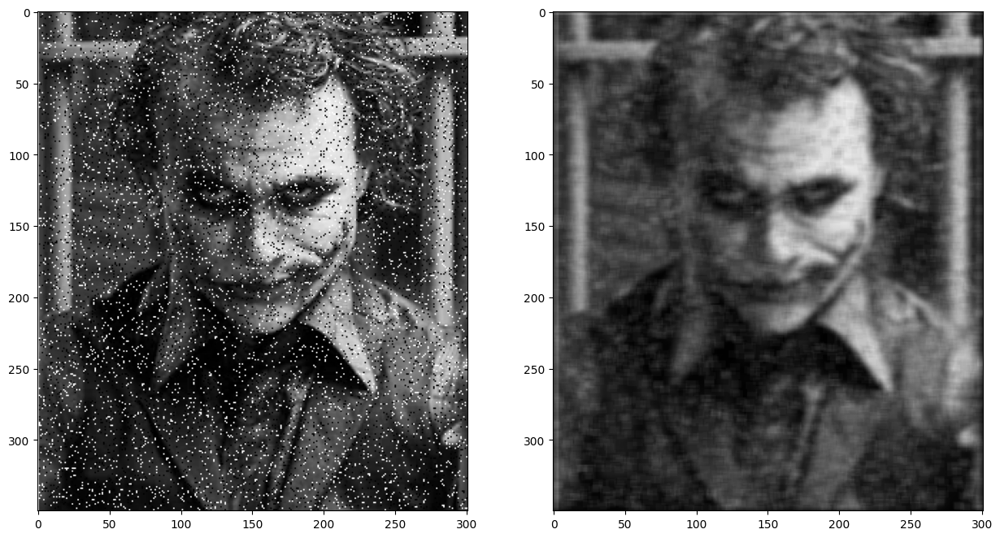

In [ ]:
img_ruido = cv2.imread('./Imagenes/ruido.png', 0)/255

filtro = np.ones((5,7))
filtro = filtro/np.sum(filtro)

img_ruido_filtrada = filtro_espacial(img_ruido, filtro)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_ruido, cmap='gray')
plt.subplot(122)
plt.imshow(img_ruido_filtrada, cmap='gray', vmin=0, vmax=1)
plt.show()

### 2.- Implemente un algoritmo que permita mejorar solo los pixeles oscuros y de bajo contraste
*Puede modificar levemente el algoritmo realizado en el enunciado **1** para lograr el objetivo*

In [ ]:
def filtro_espacial_estadistico(imagen, selem = np.ones((3,3))):
    media_global = np.mean(imagen)
    desv_global = np.std(imagen)

    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            media_loc = np.mean(multiplicacion)
            desv_loc = np.std(multiplicacion)

            if (media_loc<media_global) and (desv_loc<0.8*desv_global) and (desv_loc>0.2*desv_global):
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]*1.5
            else:
                resultado[i-filas_add, j-columnas_add] = img_pad[i,j]

    return resultado

1. ¿Cuál es el objetivo de este algoritmo y qué tipo de imágenes se benefician más de su aplicación?

  El objetivo es mejorar solo los pixeles oscuros y de bajo contraste

2. Vecindad y Kernel: ¿Cómo se define la vecindad de un píxel en este código y cuál es la importancia de la variable selem en este contexto?

  La vecindad se define por el tamaño del kernel, y selem define su forma, influenciando cómo se aplica el filtro en cada píxel.

3. ¿Qué efecto tiene el factor de escala de 1.5 en los píxeles mejorados y cómo podría ajustarse para obtener diferentes resultados?

  Aumenta la intensidad de los píxeles destacados. Se puede ajustar el valor para realzar más o menos los detalles, según se desee.

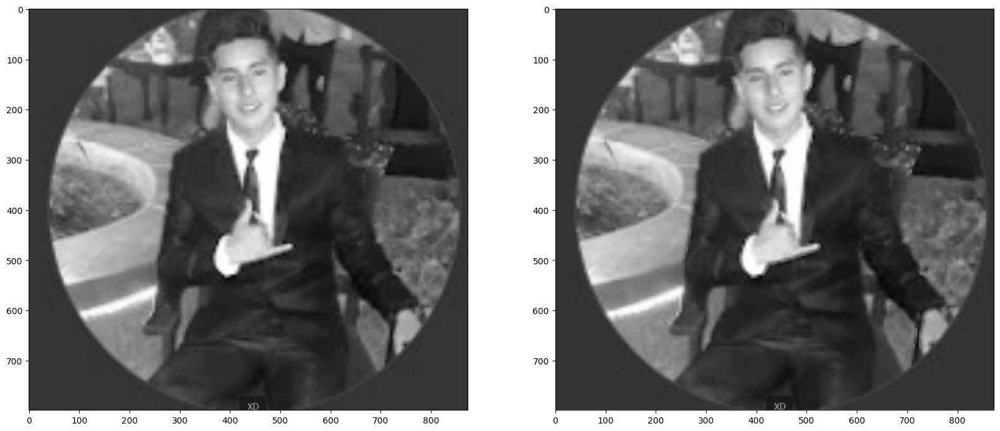

In [ ]:
img_delfin = np.uint16(cv2.imread('./Imagenes/token.jpg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(20,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 3.- Implemente los filtros estadisticos min, max, moda y mediana


In [ ]:
from scipy.stats import mode

def filtro_espacial_estadistico(imagen, selem = np.ones((3,3)), filter_type='median'):
    M, N = imagen.shape
    m, n = selem.shape

    filas_add = np.int8((m - 1) / 2)
    columnas_add = np.int8((n - 1) / 2)

#     img_pad = np.zeros((M+ filas_adicionales*2, N + columnas_adicionales*2))
    img_pad = np.zeros((M + m - 1, N + n - 1))
    img_pad[filas_add: filas_add + M, columnas_add: columnas_add+ N ] = imagen

    resultado = np.zeros_like(imagen)

    for i in np.arange(filas_add, filas_add + M):
        for j in np.arange(columnas_add, columnas_add + N):
            vecindad = img_pad[i-filas_add: i+filas_add+1, j-columnas_add: j+columnas_add+1]

            multiplicacion = vecindad * selem

            if filter_type =='min':
                resultado[i-filas_add, j-columnas_add] = np.min(multiplicacion)
            elif filter_type == 'max':
                resultado[i-filas_add, j-columnas_add] = np.max(multiplicacion)
            elif filter_type == 'median':
                resultado[i-filas_add, j-columnas_add] = np.median(multiplicacion)
            elif filter_type == 'mode':
                resultado[i-filas_add, j-columnas_add] = mode(multiplicacion, axis=None)[0]

    return resultado

1. ¿Qué es un filtro estadístico en el procesamiento de imágenes y cómo se aplica en el código mostrado?

  Un filtro estadístico utiliza valores como el promedio o la mediana de una vecindad; se aplica para reducir ruido o mejorar detalles según el tipo de filtro.

2. ¿Qué diferencias existen entre los filtros de tipo min, max, median y mode? Explica en qué situaciones sería adecuado usar cada tipo.

   - Min: atenúa el brillo, útil para eliminar destellos.
   - Max: aumenta el brillo, útil para mejorar áreas oscuras.
   - Median: reduce el ruido de "sal y pimienta".
   - Mode: útil para preservar el valor más común en vecindades homogéneas.


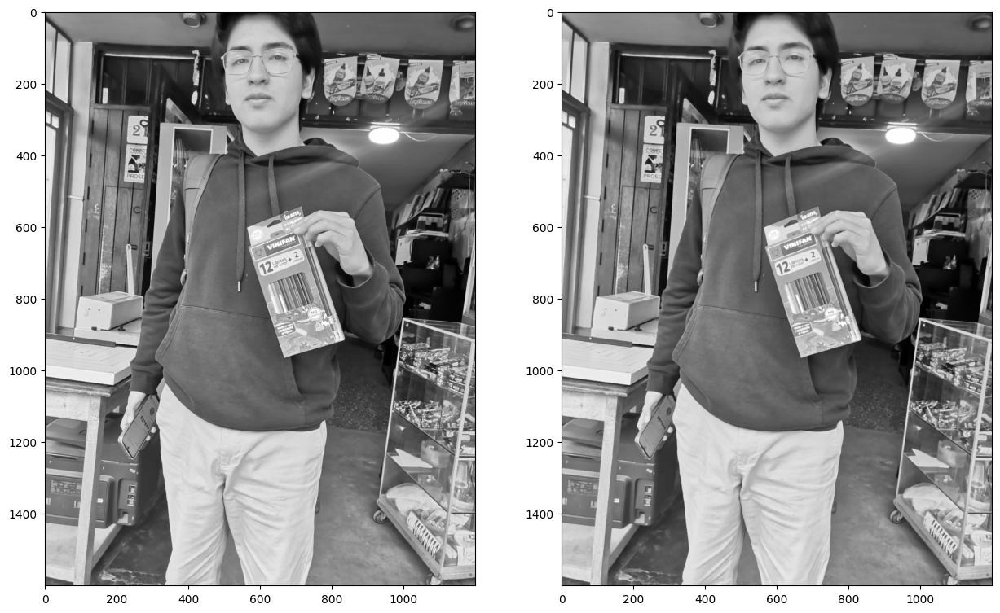

In [ ]:
#MINIMO
img_delfin = np.uint16(cv2.imread('./Imagenes/lenguita.jpg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

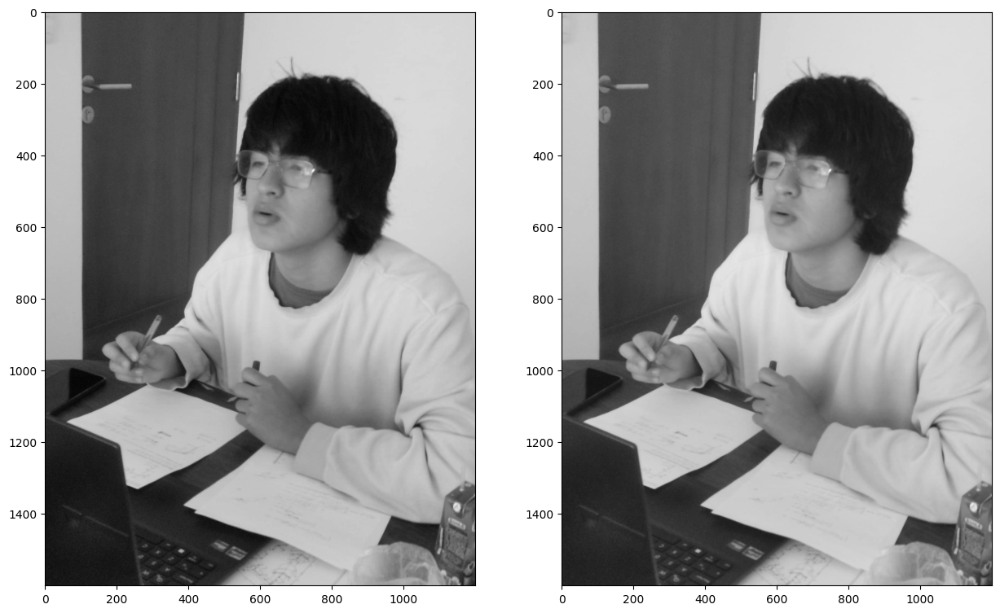

In [ ]:
#MAX
img_delfin = np.uint16(cv2.imread('./Imagenes/carlitos.jpg', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

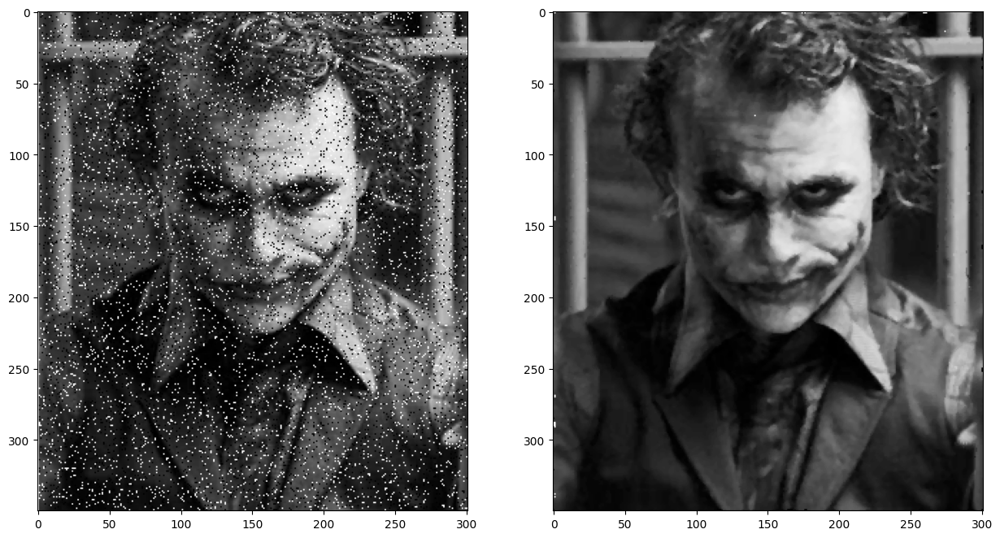

In [ ]:
#MEDIANA
img_delfin = np.uint16(cv2.imread('./Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

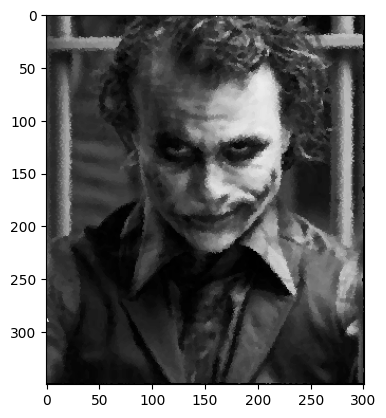

In [ ]:
img_median_mode = filtro_espacial_estadistico(img_delfin_filtrada, filter_type='mode')
plt.imshow(img_median_mode, cmap='gray')
plt.show()

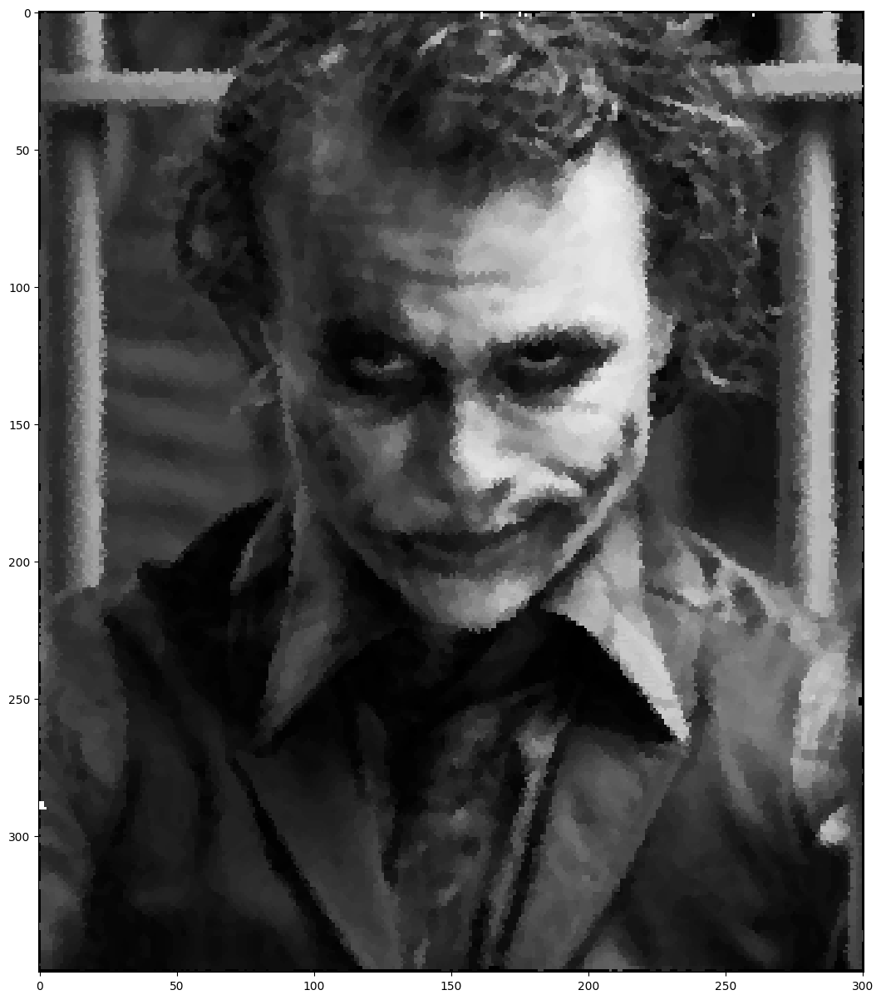

In [ ]:
plt.figure(figsize=(15,15))
plt.imshow(img_median_mode, cmap='gray')
plt.show()

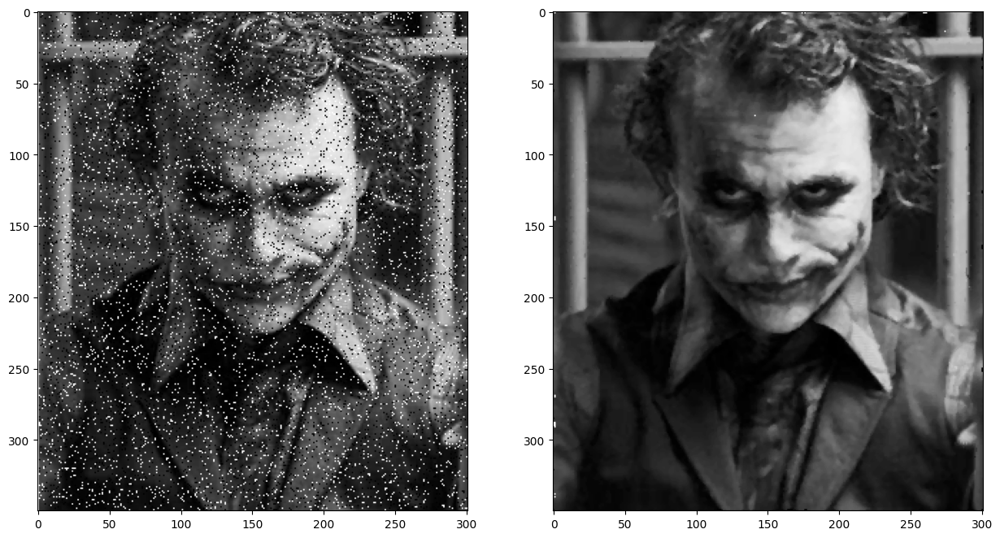

In [ ]:
#MODA
img_delfin = np.uint16(cv2.imread('./Imagenes/ruido.png', 0))
img_delfin_filtrada = filtro_espacial_estadistico(img_delfin)
plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_delfin, cmap='gray')
plt.subplot(122)
plt.imshow(img_delfin_filtrada, cmap='gray')
plt.show()

### 4.- Implemente los filtros espaciales de suavizado y nitidez explicados en clase

Utilizando la funcion **convolve2d(img, kernel, mode= "same")** de **scipy.signal** y los kernels:
(tambien se puede usar **correlate2d**)
* Promedio
* Gaussiano
* Laplaciano


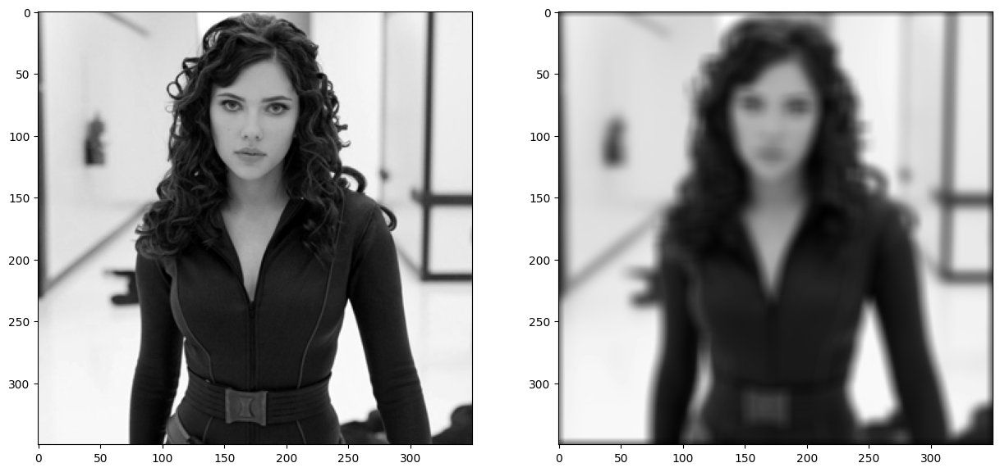

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("./Imagenes/scarlett_oc.png", 0)/255
kernel = np.ones((11,11))/121

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

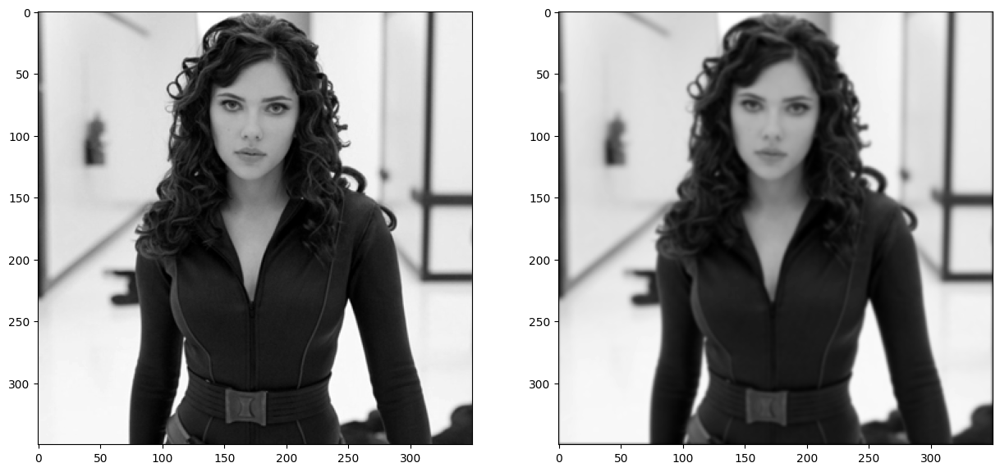

In [ ]:
#PROMEDIO
from scipy import signal

img = cv2.imread("./Imagenes/scarlett_oc.png", 0)/255
# kernel = np.array([[1,2,1], [2,4,2], [1,2,1]])/16
kernel = np.array([1,4,7,4,1])*np.array([[1],[4],[7],[4],[1]])
kernel = kernel/np.sum(kernel)

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(np.abs(out), cmap="gray", vmin=0, vmax=1)
plt.show()

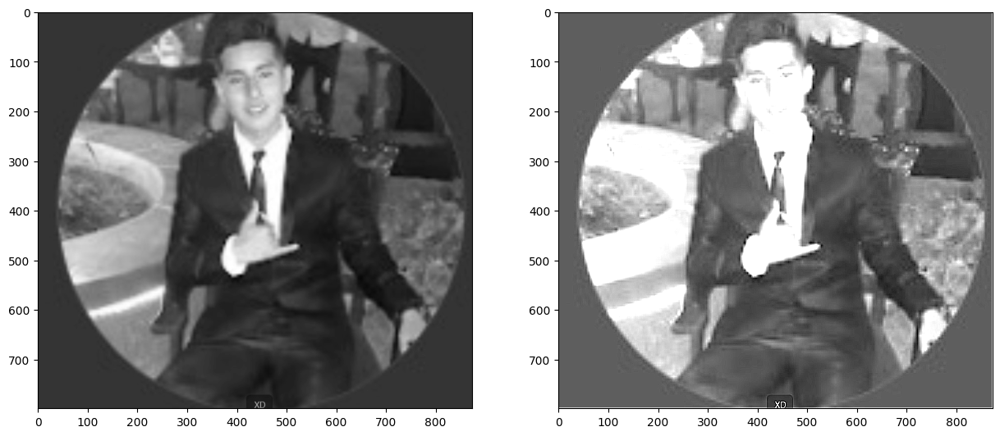

In [ ]:
#LAPLACIANO
from scipy import signal
A = 1.5
img = cv2.imread("./Imagenes/token.jpg", 0)/255
kernel = np.array([[-1,-1,-1], [-1,A+8,-1], [-1,-1,-1]])

out = signal.convolve2d(img, kernel, mode= "same")

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

**Utilizando OpenCV:**
* cv2.blur(img, (Tamaño_kernel))
* cv2.GaussianBlur(img,(Tamaño_kernel),desviacion_estandar)
* cv2.medianBlur(img,Tamaño_kernel)
* cv2.bilateralFilter(img,tamaño_kernel,sigmacolor,sigmaspace)  [Mas info](https://homepages.inf.ed.ac.uk/rbf/CVonline/LOCAL_COPIES/MANDUCHI1/Bilateral_Filtering.html)

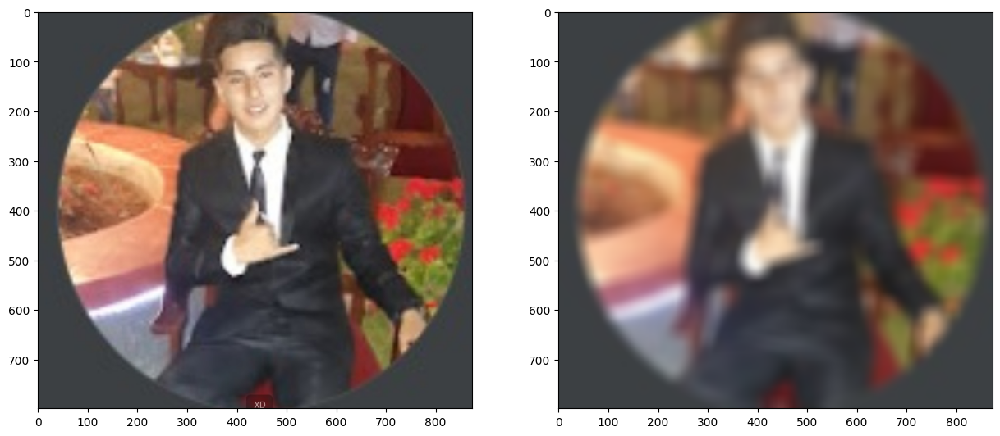

In [63]:
img = cv2.imread("./Imagenes/token.jpg")[..., ::-1]

out = cv2.blur(img, (31,31))

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

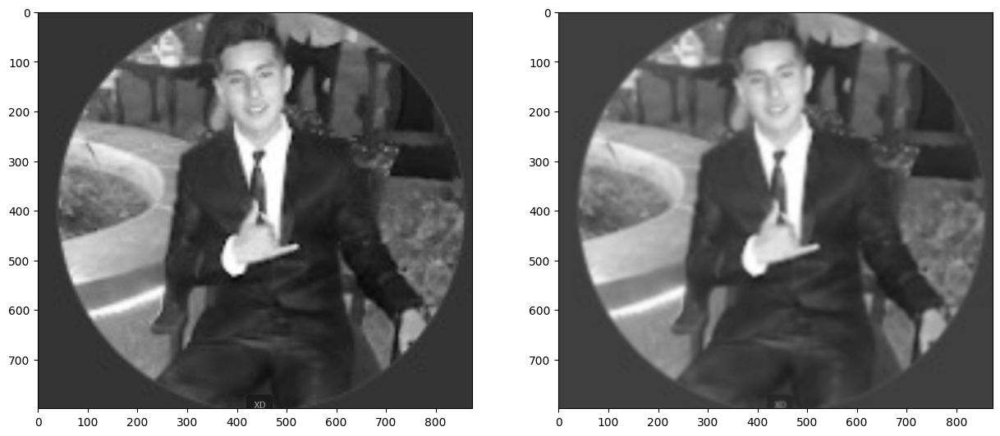

In [58]:
out = cv2.GaussianBlur(img,(501,501), 2)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

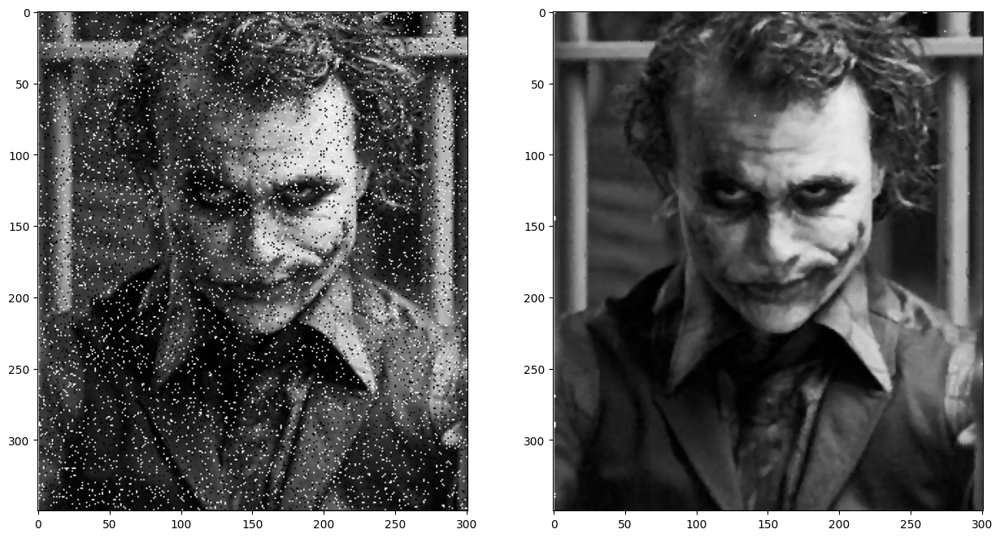

In [53]:
img_joker = cv2.imread('./Imagenes/ruido.png')[..., ::-1]

img_joker_filtrada = cv2.medianBlur(img_joker, 3)

plt.subplots(1,2, figsize=(15,20))
plt.subplot(121)
plt.imshow(img_joker, cmap='gray')
plt.subplot(122)
plt.imshow(img_joker_filtrada, cmap='gray')
plt.show()

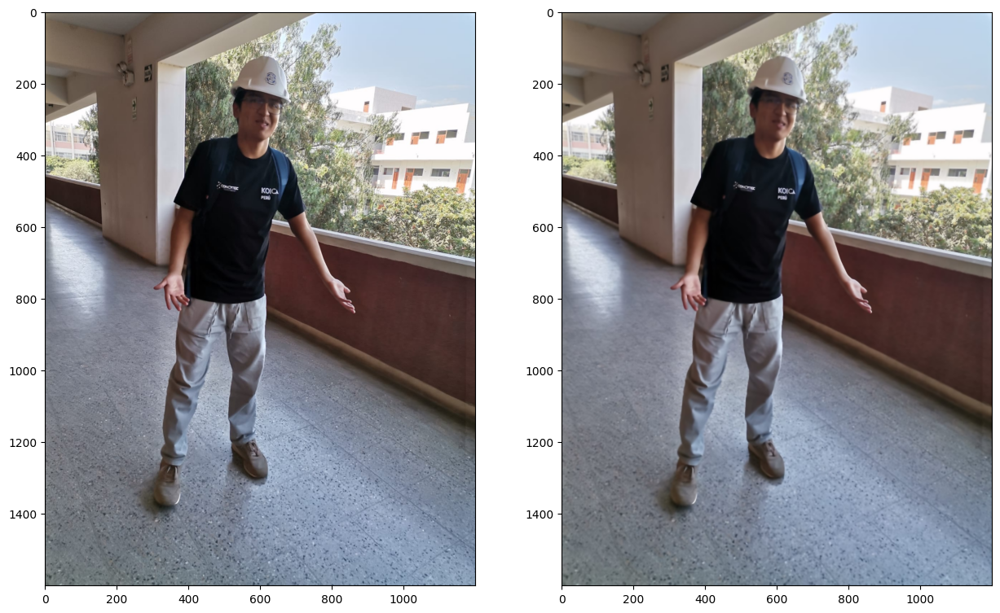

In [ ]:
img_marcelito = cv2.imread('./Imagenes/querevalú.jpg')[..., ::-1]
out = cv2.bilateralFilter(img_marcelito,7, 160, 160)

plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(img_marcelito, cmap="gray")
plt.subplot(122)
plt.imshow(out, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la diferencia fundamental entre los filtros de suavizado (como el de promedio y el Gaussiano) y los filtros de nitidez (como el Laplaciano)?

  Los filtros de suavizado reducen ruido y detalles, mientras que los de nitidez realzan bordes y detalles.

2. ¿Cuáles son las principales diferencias en los resultados obtenidos al aplicar un filtro de promedio versus un filtro Gaussiano?

   El filtro de promedio suaviza uniformemente, mientras que el Gaussiano preserva mejor los bordes debido a su ponderación en torno al centro.

3. ¿Qué propiedades tiene el kernel Laplaciano y cómo contribuye a la nitidez de la imagen? ¿Qué efectos visuales produce al aplicarse a una imagen?
  
  El kernel Laplaciano detecta cambios bruscos de intensidad, resaltando bordes y mejorando el enfoque; produce una imagen con contornos más definidos.

4. ¿Qué significa el argumento mode="same" en la función convolve2d y cómo afecta el tamaño de la imagen resultante después de aplicar el filtro

  mode="same" mantiene el tamaño de la imagen original, añadiendo padding si es necesario para conservar las dimensiones.


### 5.- Implemente un algoritmo para muestre el uso de la mascara de desenfoque (unsharp mask) y el filtro de altoaumento (Highboost)

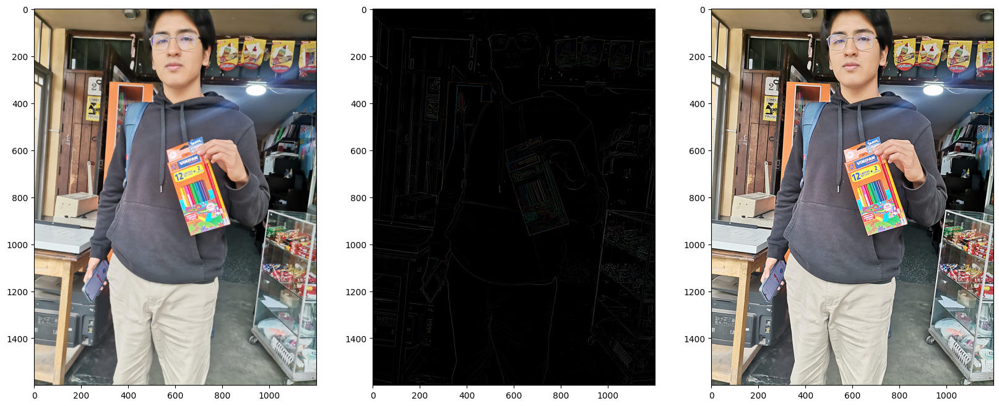

In [ ]:
img = cv2.imread("./Imagenes/lenguita.jpg")[..., ::-1]/255

blur = cv2.blur(img, (7,7))

mask = img - blur

unsharp_image = mask + img

plt.figure(figsize=(20,15))
plt.subplot(131)
plt.imshow(img, cmap="gray")
plt.subplot(132)
plt.imshow(mask, cmap="gray")
plt.subplot(133)
plt.imshow(unsharp_image, cmap='gray', vmin=0, vmax=1)
plt.show()

1. ¿Cómo funciona la máscara de desenfoque (unsharp mask) para realzar los detalles de una imagen, y cuál es el papel del filtro de suavizado en este proceso?

  La máscara de desenfoque resalta detalles al restar una versión suavizada de la imagen; el filtro de suavizado crea la imagen "borrosa" que se resta para realzar bordes.

2.  ¿En qué se diferencia el filtro de alto aumento (Highboost) de la máscara de desenfoque estándar, y cómo se puede ajustar el factor de amplificación (boosting factor) para controlar el nivel de realce en la imagen?

  El Highboost suma una versión amplificada de la imagen original, intensificando detalles. El factor de amplificación controla cuánto se resaltan los detalles.


### 6.- Implemente un algoritmo para mostrar la gradiente de una imagen
**Use las mascaras:**
* Roberts
* Prewit
* Sobel
* Scharr

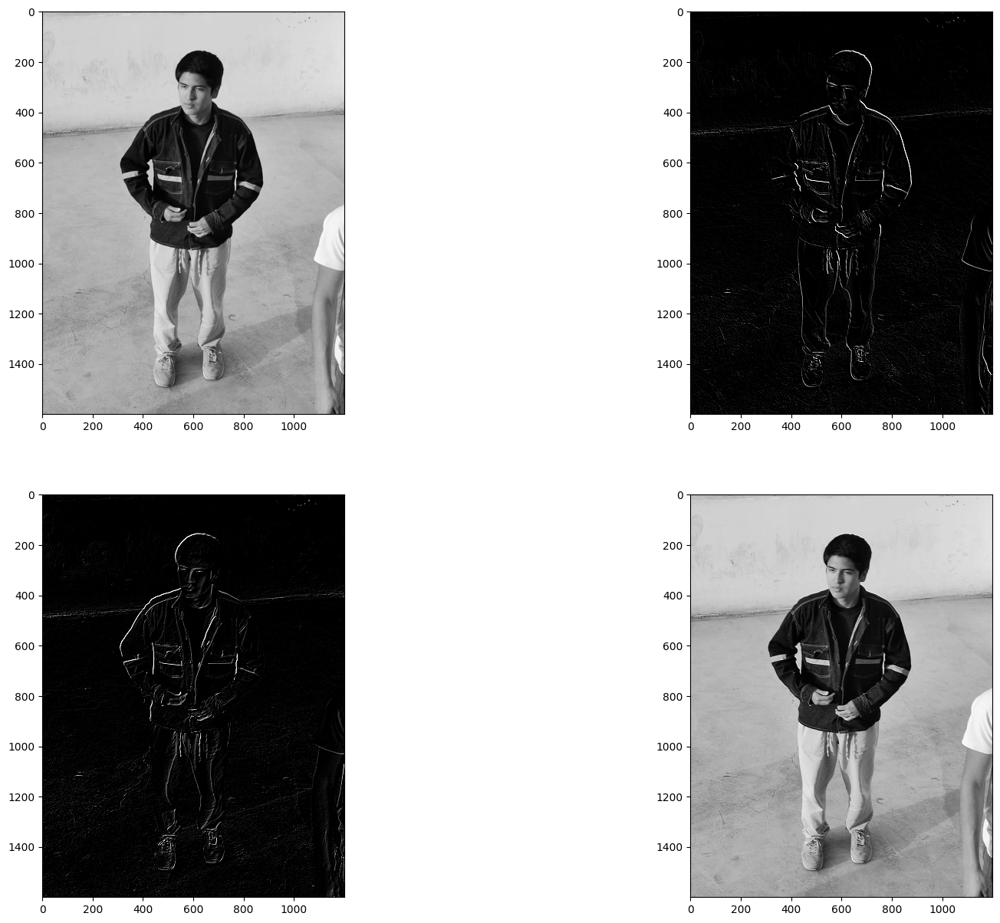

In [ ]:
#ROBERTS
img = cv2.imread("./Imagenes/marcelito.jpg", 0)/255

kernelh = np.array([[0,-1],[1,0]])
kernelv = np.array([[-1,0],[0,1]])

outh = signal.convolve2d(img, kernelh, mode= "same")
outv = signal.convolve2d(img, kernelv, mode= "same")

outf = outh + outv

plt.figure(figsize=(20,15))
plt.subplot(221)
plt.imshow(img, cmap="gray")
plt.subplot(222)
plt.imshow(outh * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(223)
plt.imshow(outv * 5, cmap="gray", vmin=0, vmax=1)
plt.subplot(224)
plt.imshow(outf + img, cmap="gray", vmin=0, vmax=1)
plt.show()

1. ¿Cuál es la característica distintiva de la máscara de Roberts al calcular el gradiente de una imagen, y por qué podría ser menos precisa que otras máscaras?

  La máscara de Roberts calcula el gradiente con desplazamientos mínimos, lo que puede ser menos preciso en imágenes con ruido o bordes tenues.


2. ¿Cómo afectan las máscaras de Sobel y Scharr a la precisión y sensibilidad en la detección de bordes en una imagen? ¿En qué casos se prefiere una sobre la otra?

  La máscara de Sobel es más general y estable, mientras que Scharr ofrece mayor precisión en bordes fuertes. Se prefiere Scharr para bordes precisos y Sobel para una detección más robusta en general.